# Download and extract dataset and source repo

In [1]:
!git clone https://github.com/Dibz15/OpenMineChangeDetection.git
import sys
sys.path.append('/content/OpenMineChangeDetection/')

fatal: destination path 'OpenMineChangeDetection' already exists and is not an empty directory.


In [ ]:
from OpenMineChangeDetection.utils import download_prep_oms2cd
download_prep_oms2cd(output_dir='OMS2CD')

# Install dependencies

In [2]:
%%capture
!pip install rasterio==1.3.8
!pip install torchgeo==0.4.1
!pip install tiler==0.5.7
!pip install kornia==0.6.12
!pip install lightning==1.9.5

# Random seed, set device, and import modules

In [3]:
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger
import torch
import random
import numpy as np

if torch.cuda.is_available():
  device = torch.device('cuda')
else:
  device = torch.device('cpu')

torch.manual_seed(543)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(543)
random.seed(543)
np.random.seed(543)

In [4]:
from OpenMineChangeDetection.datasets import OMS2CDDataModule
from torchgeo.transforms import AugmentationSequential
import kornia.augmentation as K

import os
import numpy as np
from OpenMineChangeDetection.ddpm_cd.ddpm_lightning import DDPM, CD

# Prepare dataset and train options

In [6]:
import OpenMineChangeDetection.ddpm_cd.core.logger as Logger

class Args:
    def __init__(self):
        self.config = 'OpenMineChangeDetection/ddpm_cd/config/oms2cd.json'
        self.phase = 'train'
        self.gpu_ids = '0'
        self.debug = False
        self.enable_wandb = False
        self.log_eval = False

opt = Logger.parse(Args())
opt = Logger.dict_to_nonedict(opt)

export CUDA_VISIBLE_DEVICES=0


In [7]:
datamodule = OMS2CDDataModule(root='OMS2CD', bands='rgb', load_area_mask=False, 
                              batch_size=opt['datasets']['train']['batch_size'],
                              num_workers=opt['datasets']['train']['num_workers'],
                              tile_mode="constant", index_no_mask=True, stride=100)
datamodule.setup('fit')
datamodule.setup('validate')
datamodule.setup('test')
datamodule.aug = AugmentationSequential(
    K.RandomHorizontalFlip(p=0.5, same_on_batch=False),
    K.RandomVerticalFlip(p=0.5, same_on_batch=False),
    K.RandomGaussianNoise(mean=0.0, std=0.1, same_on_batch=False),
    K.RandomAffine(degrees=30, translate=(0.1, 0.1), scale=(0.8, 1.2), same_on_batch=False),
    K.Normalize(mean=datamodule.mean, std=datamodule.std),
    data_keys=["image", "mask"],
)

In [8]:

opt['len_train_dataloader'] = len(datamodule.train_dataloader())
opt['len_val_dataloader'] = len(datamodule.val_dataloader())
datamodule.setup('test')
opt['len_test_dataloader'] = len(datamodule.test_dataloader())

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
checkpoint_callback = ModelCheckpoint(
    dirpath=opt['path']['checkpoint'],
    filename='cd_model_ft_{epoch}-{val_loss:.2f}',
    save_top_k=2,  # save only the best model
    monitor='val_loss',  # metric for defining the best model
    mode='min',  # aim to minimize the monitored metric
    save_weights_only=False,  # if False, it saves the full model, not only weights
    verbose=True,
    save_last = True
)
early_stopping_callback = EarlyStopping(monitor="val_loss", min_delta=0.00, patience=60)
logger = TensorBoardLogger(save_dir="experiments", name="saved_logs")

# PyTorch Lightning Trainer
trainer = Trainer(
    accelerator=accelerator,
    callbacks=[checkpoint_callback, early_stopping_callback],
    fast_dev_run=False,
    log_every_n_steps=5,
    logger=logger,
    min_epochs=5,
    max_epochs=opt['train']['n_epoch']*2,
    precision='16'
)

Using 16bit None Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


# Train network

In [ ]:

if opt['path_cd']['resume_state']:
    print(f"Resuming from {opt['path_cd']['resume_state']}")
    change_detection = CD(opt)
    if opt['path_cd']['finetune_path'] is not None:
        change_detection.load_network()
    trainer.fit(change_detection, datamodule=datamodule, ckpt_path=os.path.join(opt['path_cd']['checkpoint'], opt['path_cd']['resume_state']))
else:
    change_detection = CD(opt)
    change_detection.diffusion_model.load_network()
    if opt['path_cd']['finetune_path'] is not None:
        change_detection.load_network()
    # for param in change_detection.netCD.parameters():
    #     param.requires_grad = False
    # for param in change_detection.netCD.clfr_stg1.parameters():
    #     param.requires_grad = True
    # for param in change_detection.netCD.clfr_stg2.parameters():
    #     param.requires_grad = True
    trainer.fit(change_detection, datamodule=datamodule)

Loading DDPM gen state dict from diffusion_weights/I190000_E97_gen.pth
Loading CD gen state dict from diffusion_weights/best_cd_model_gen.pth.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params
-----------------------------------------------------
0 | diffusion_model | DDPM             | 391 M 
1 | netCD           | cd_head_v2       | 44.0 M
2 | loss_func       | CrossEntropyLoss | 0     
-----------------------------------------------------
74.9 K    Trainable params
434 M     Non-trainable params
435 M     Total params
870.024   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/usr/local/lib/python3.9/dist-packages/lightning/pytorch/utilities/data.py:83: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(
/usr/local/lib/python3.9/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `Da

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/lightning/pytorch/utilities/data.py:83: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(
Epoch 0, global step 710: 'val_loss' reached 0.06634 (best 0.06634), saving model to '/notebooks/experiments/ddpm-RS-CDHead-OMS2CD_230729_151316/checkpoint/cd_model_ft_epoch=0-val_loss=0.07.ckpt' as top 2


Validation: 0it [00:00, ?it/s]

Epoch 1, global step 1420: 'val_loss' reached 0.06058 (best 0.06058), saving model to '/notebooks/experiments/ddpm-RS-CDHead-OMS2CD_230729_151316/checkpoint/cd_model_ft_epoch=1-val_loss=0.06.ckpt' as top 2


Validation: 0it [00:00, ?it/s]

Epoch 2, global step 2130: 'val_loss' reached 0.05178 (best 0.05178), saving model to '/notebooks/experiments/ddpm-RS-CDHead-OMS2CD_230729_151316/checkpoint/cd_model_ft_epoch=2-val_loss=0.05.ckpt' as top 2


# Test network

In [ ]:
trainer.test(change_detection, datamodule=datamodule)

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir=/tmp/experiments/saved_logs --port=6005
change_detection = change_detection.to(device).eval()

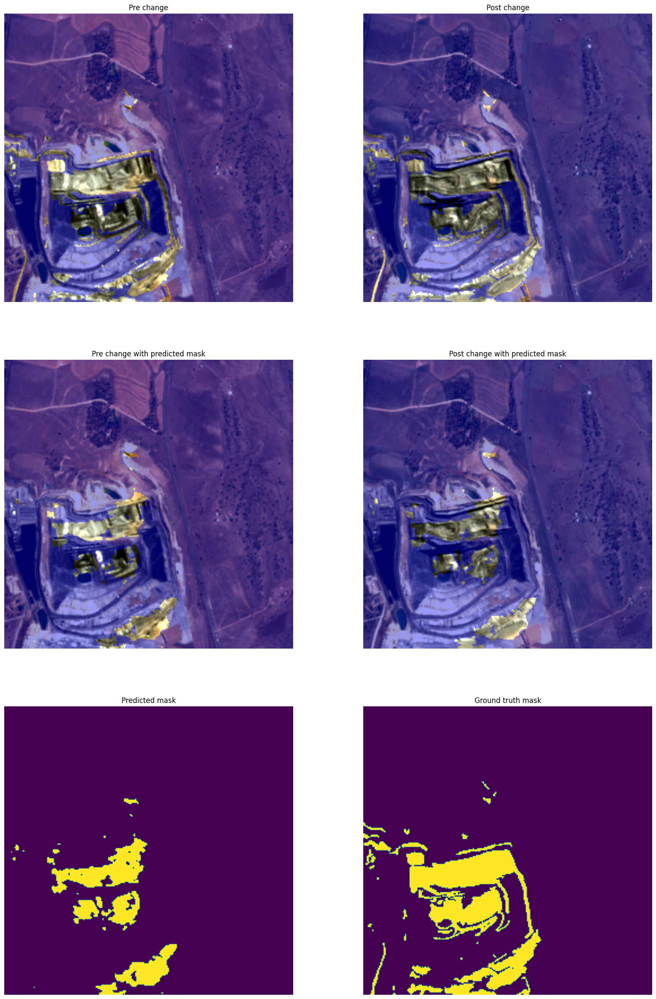

In [16]:
# from OpenMineChangeDetection.utils import plot_prediction
# from OpenMineChangeDetection.datasets.utils import normalize_sample
from OpenMineChangeDetection.datasets import OMS2CD
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
from torchgeo.datasets.utils import draw_semantic_segmentation_masks


def plot_prediction(
    model: torch.nn.Module,
    sample,
    bands: str,
    colormap: str = "blue",
    threshold: float = 0.5,
    alpha: float = 0.4,
    show_titles: bool = True,
    suptitle = None,
) -> None:
    model = model.eval()
    with torch.no_grad():
        img = sample['image']
        if len(img.shape) < 4:
            sample['image'] = img.unsqueeze(0)
        sample['image'] = sample['image'].to(model.device)
        mask_pred = model(sample).cpu()
        mask_pred = torch.argmax(mask_pred, dim=1, keepdim=False)

    if len(img.shape) > 3:
        img = img.squeeze(0)
    mask_pred = (mask_pred > threshold).float().cpu()

    rgb_inds = [3, 2, 1] if bands == "all" else [0, 1, 2]

    def get_masked(img: torch.Tensor, mask: torch.Tensor) -> "np.typing.NDArray[np.uint8]":
        rgb_img = img[rgb_inds].float().cpu().numpy()
        per02 = np.percentile(rgb_img, 2)
        per98 = np.percentile(rgb_img, 98)
        rgb_img = (np.clip((rgb_img - per02) / (per98 - per02), 0, 1) * 255).astype(
            np.uint8
        )
        array = draw_semantic_segmentation_masks(
            torch.from_numpy(rgb_img),
            mask.detach().cpu(),
            alpha=alpha,
            colors=colormap,
        )
        return array

    idx = img.shape[0] // 2
    image1 = get_masked(img[:idx], sample["mask"])
    image2 = get_masked(img[idx:], sample["mask"])
    
    image3 = get_masked(img[:idx], mask_pred)
    image4 = get_masked(img[idx:], mask_pred)
    image5 = to_pil_image(mask_pred.byte())
    image6 = to_pil_image(sample["mask"].byte())

    fig, axs = plt.subplots(3, 2, figsize=(20, 30))
    axs[0, 0].imshow(image1)
    axs[0, 0].axis("off")
    axs[0, 1].imshow(image2)
    axs[0, 1].axis("off")
    axs[1, 0].imshow(image3)
    axs[1, 0].axis("off")
    axs[1, 1].imshow(image4)
    axs[1, 1].axis("off")
    axs[2, 0].imshow(image5)
    axs[2, 0].axis("off")
    axs[2, 1].imshow(image6)
    axs[2, 1].axis("off")

    if show_titles:
        axs[0, 0].set_title("Pre change")
        axs[0, 1].set_title("Post change")
        axs[1, 0].set_title("Pre change with predicted mask")
        axs[1, 1].set_title("Post change with predicted mask")
        axs[2, 0].set_title("Predicted mask")
        axs[2, 1].set_title("Ground truth mask")

    if suptitle is not None:
        plt.suptitle(suptitle)

    plt.show()

normalize_sample = OMS2CD.GetNormalizeTransform(bands='rgb')
dataset = OMS2CD(root='OMS2CD', split='val', bands='rgb')
sample = normalize_sample(dataset[81])
sample = {k: v.to(device) for k,v in sample.items() if isinstance(v, torch.Tensor)}
plot_prediction(change_detection, sample, bands="rgb", colormap="blue", threshold=0.23)

In [ ]:
from OpenMineChangeDetection.utils import get_mask_preds_ddpmcd, evaluate_model, plot_pr_curve
datamodule.setup('test')
stats = evaluate_model(change_detection.to(device).eval(), datamodule.test_dataloader(), get_mask_preds_ddpmcd, device, threshold=0.30)
print(stats)

In [ ]:
plot_pr_curve(stats['PRC'])

In [ ]:
stats = evaluate_model(model.to(device).eval(), datamodule.val_dataloader(), get_mask_preds_lsnet, device, threshold=0.30)
print(stats)


In [ ]:
plot_pr_curve(stats['PRC'])